In [2]:
pip install pandas

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install seaborn

   ---------------------------------------- 0.0/294.9 kB ? eta -:--:--
   ---------------------------------------- 0.0/294.9 kB ? eta -:--:--
   ---- ---------------------------------- 30.7/294.9 kB 640.0 kB/s eta 0:00:01
   -------- ------------------------------ 61.4/294.9 kB 812.7 kB/s eta 0:00:01
   ---------- ---------------------------- 81.9/294.9 kB 573.4 kB/s eta 0:00:01
   --------------- ---------------------- 122.9/294.9 kB 798.9 kB/s eta 0:00:01
   ---------------------------------- ----- 256.0/294.9 kB 1.1 MB/s eta 0:00:01
   ---------------------------------------- 294.9/294.9 kB 1.1 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [5]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras import datasets, layers, models, Input
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import GlobalAveragePooling2D,Dense, BatchNormalization, Dropout, Flatten, Conv2D, MaxPooling2D,Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

import numpy as np
import pandas as pd
import random
import os
from sklearn.metrics import confusion_matrix, classification_report

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import seaborn as sns

import math
import PIL
import random
import sys

In [6]:
import warnings
warnings.filterwarnings("ignore")

In [7]:
dict_train = r'D:\Food Recognition_Vs\training'
dict_valid = r'D:\Food Recognition_Vs\validation'
dict_test = r'D:\Food Recognition_Vs\evaluation'

path = r'"D:\Food Recognition_Vs"'

In [8]:
# Make dictionary storing images for each category under train data.
train_files = {i: os.listdir(os.path.join(dict_train, i)) for i in os.listdir(dict_train)}
valid_files = {i: os.listdir(os.path.join(dict_valid, i)) for i in os.listdir(dict_valid)}
test_files = {i: os.listdir(os.path.join(dict_test, i)) for i in os.listdir(dict_test)}


In [9]:
val_loss = list()
val_accuracy = list()
test_loss= list()
test_accuracy = list()

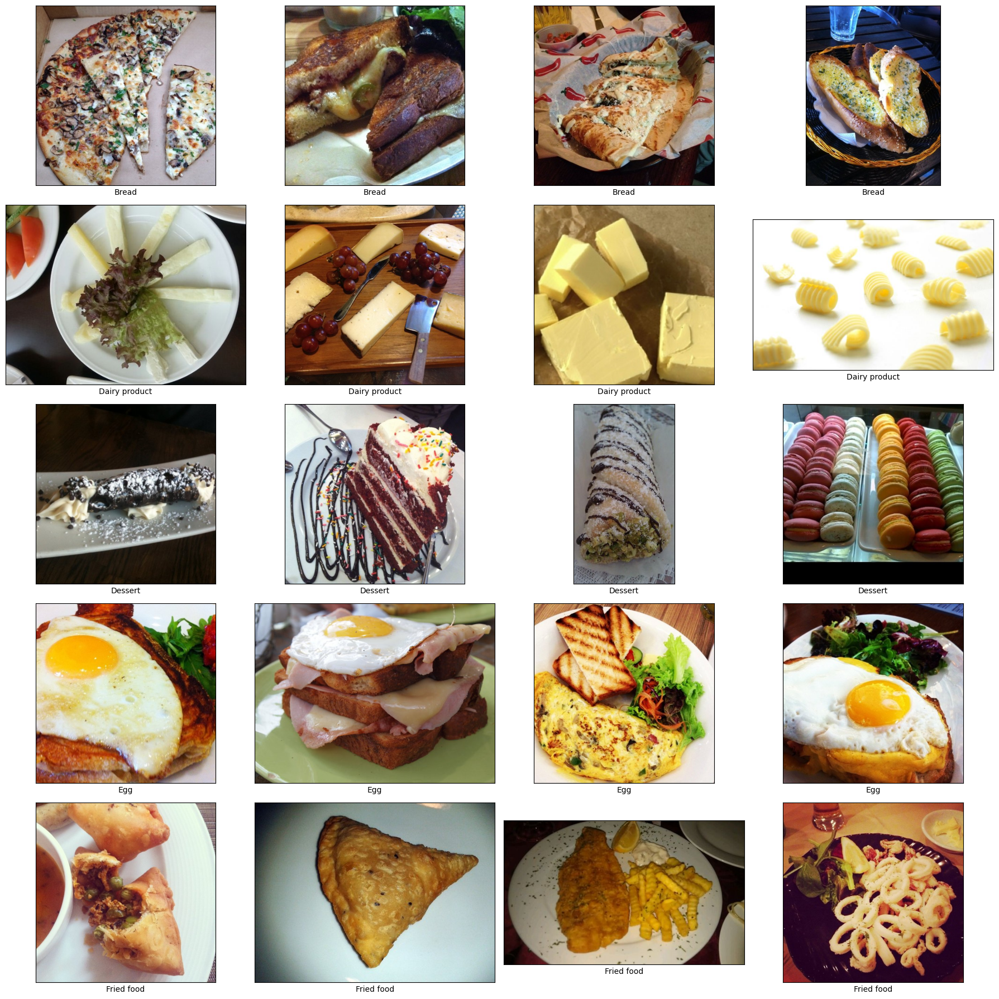

In [10]:
class_names = list(train_files.keys())
fig, axes = plt.subplots(len(train_files.keys()), 4, figsize=(18,18))
for i, item in enumerate(class_names):
    images = random.sample(train_files[item], 4)
    for j, image in enumerate(images):
        img = PIL.Image.open(os.path.join(dict_train, item, image))
        axes[i, j].imshow(img)
        axes[i, j].set(xlabel=item, xticks=[], yticks=[])
fig.tight_layout()

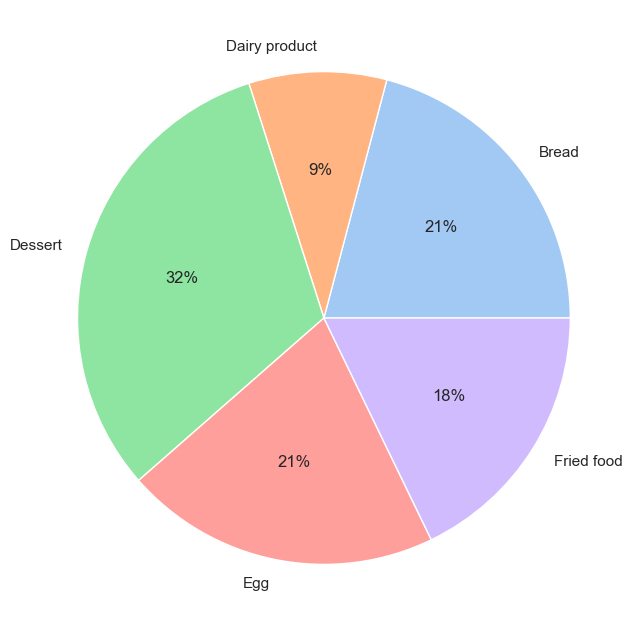

In [11]:
# Class distribution
counts = [len(train_files[item]) for item in class_names]
sns.set(rc={'figure.figsize': (8, 8)})
plt.pie(counts, labels=class_names, colors=sns.color_palette('pastel')[0:5], autopct='%.0f%%')
plt.show()

In [12]:
# Data Augmentation for Training, Validation, and Testing with ImageDataGenerator
train_gen = ImageDataGenerator(
    rotation_range = 20,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    vertical_flip = True,
    fill_mode = 'nearest',
    rescale=1./255,
    validation_split = 0.2
)

val_gen = ImageDataGenerator(
    rescale=1./255, 
    validation_split = 0.2)

# For test data we only rescale the data. Never augment test data (for obvious reasons)
test_gen = ImageDataGenerator(rescale=1./255)

In [13]:

BATCH_SIZE = 32

train_generator = train_gen.flow_from_directory(dict_train, target_size = (256,256), 
                                                     shuffle = True,
                                                     class_mode = 'categorical', 
                                                     batch_size = BATCH_SIZE, 
                                                     subset = "training")

valid_generator = val_gen.flow_from_directory(dict_valid, target_size = (256,256),
                                             shuffle = True, 
                                             class_mode = 'categorical',
                                             batch_size = BATCH_SIZE,
                                             subset = 'validation')

test_generator = test_gen.flow_from_directory(dict_test, target_size = (256, 256),
                                             shuffle = False,
                                             class_mode = 'categorical',
                                             batch_size = BATCH_SIZE)

Found 3808 images belonging to 5 classes.
Found 330 images belonging to 5 classes.
Found 1638 images belonging to 5 classes.


In [14]:
base_model = InceptionResNetV2(weights = 'imagenet',
                              include_top = False,
                              input_shape = (256, 256, 3))


219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 57s 0us/step


In [15]:
base_model.trainable = False

In [16]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
model = tf.keras.Sequential([base_model,
                             global_average_layer,
                             Dense(256, activation = 'relu'),
                             Dropout(0.2),
                             Dense(128, activation = 'relu'),
                             Dropout(0.2),
                             Dense(5, activation = 'softmax')])

In [19]:
# Compiling model with low learning rate

model.compile(optimizer = Adam(learning_rate = base_learning_rate),
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])

In [22]:
# EarlyStopping and ModelCheckpoint callbacks to keep track with model performance

EPOCHS = 5
es = EarlyStopping(monitor = 'loss',
                  mode = 'min',
                  verbose = 1,
                  patience = 20)

mc = ModelCheckpoint(filepath = 'best_model_res.keras',
                     monitor = 'loss',
                     verbose = 1,
                     save_best_only = True)

history = model.fit(train_generator,
                    steps_per_epoch = train_generator.samples // BATCH_SIZE,
                    epochs = EPOCHS,
                    callbacks = [es, mc],
                    verbose = 1,
                    validation_steps = valid_generator.samples // BATCH_SIZE)

Epoch 1/5
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.4476 - loss: 1.3491
Epoch 1: loss improved from inf to 1.16969, saving model to best_model_res.keras
119/119 ━━━━━━━━━━━━━━━━━━━━ 450s 4s/step - accuracy: 0.4484 - loss: 1.3476
Epoch 2/5

Epoch 2: loss improved from 1.16969 to 0.00000, saving model to best_model_res.keras
119/119 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 3/5
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.6562 - loss: 0.9197
Epoch 3: loss did not improve from 0.00000
119/119 ━━━━━━━━━━━━━━━━━━━━ 406s 3s/step - accuracy: 0.6563 - loss: 0.9194
Epoch 4/5

Epoch 4: loss did not improve from 0.00000
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 131us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 5/5
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7056 - loss: 0.8018
Epoch 5: loss did not improve from 0.00000
119/119 ━━━━━━━━━━━━━━━━━━━━ 407s 3s/step - accuracy: 0.7057 - loss: 0.8017


In [24]:
# Evaluating the model with the validation_generator

alidation = model.evaluate(valid_generator, verbose=1)
testing = model.evaluate(test_generator, verbose=1)

11/11 ━━━━━━━━━━━━━━━━━━━━ 39s 3s/step - accuracy: 0.7829 - loss: 0.6107
52/52 ━━━━━━━━━━━━━━━━━━━━ 163s 3s/step - accuracy: 0.7719 - loss: 0.6163


In [26]:
# Comparing validation and test loss and accuracy
validation = model.evaluate(valid_generator, verbose=1)
testing = model.evaluate(test_generator, verbose=1)

print('Val loss:', validation[0])
print('Val accuracy:', validation[1])

test_loss.append(testing[0])
test_accuracy.append(testing[1])

print('Test loss:', testing[0])
print('Test accuracy:', testing[1])

# Low losses and high accuracy, model is performing well

11/11 ━━━━━━━━━━━━━━━━━━━━ 35s 3s/step - accuracy: 0.7870 - loss: 0.6398
52/52 ━━━━━━━━━━━━━━━━━━━━ 169s 3s/step - accuracy: 0.7719 - loss: 0.6163
Val loss: 0.6081006526947021
Val accuracy: 0.7909091114997864
Test loss: 0.5957858562469482
Test accuracy: 0.7789987921714783


In [ ]:
# Predict using testing_generator
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)


52/52 [==============================] - 128s 2s/step


In [ ]:
import itertools

# Plot the confusion matrix. Set Normalize = True/False
# Code from kaggle transfer learning classification model
def plot_confusion_matrix(cm, classes, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):
    plt.figure(figsize=(10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        cm = np.around(cm, decimals=2)
        cm[np.isnan(cm)] = 0.0
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

               precision    recall  f1-score   support

        Bread       0.87      0.75      0.81       368
Dairy product       0.97      0.24      0.38       148
      Dessert       0.79      0.92      0.85       500
          Egg       0.77      0.84      0.80       335
   Fried food       0.74      0.87      0.80       287

     accuracy                           0.80      1638
    macro avg       0.83      0.72      0.73      1638
 weighted avg       0.81      0.80      0.78      1638



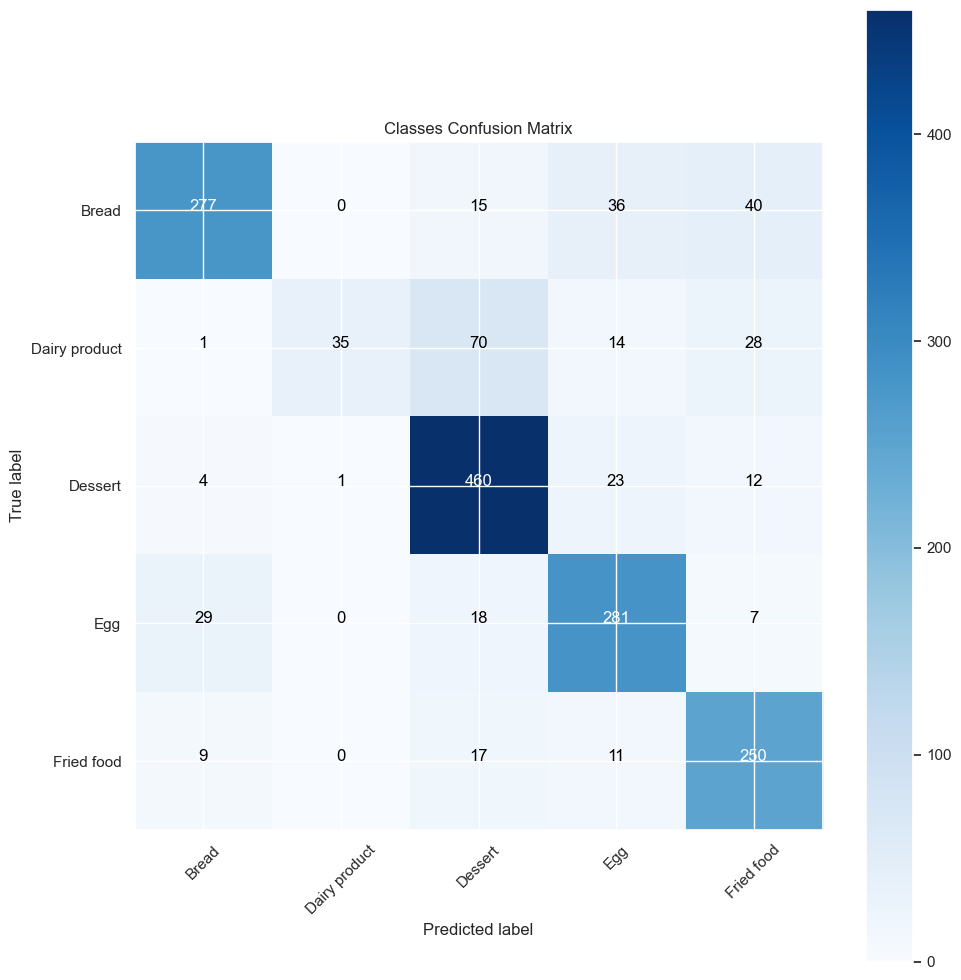

In [ ]:
# generate confusion matrix
conf_matrix = confusion_matrix(test_generator.classes, y_pred_classes)
plot_confusion_matrix(conf_matrix, class_names, normalize=False, title='Classes Confusion Matrix')
print(classification_report(test_generator.classes, y_pred_classes, target_names=class_names))

In [ ]:
labels = {i: name for i, name in enumerate(class_names)}
prediction = []
original = []
image_list = []

In [ ]:
# Loading images and their predictions into lists
for i in os.listdir(dict_test):
    for item in os.listdir(os.path.join(dict_test, i)):
        img = PIL.Image.open(os.path.join(dict_test, i, item)).resize((256, 256))
        image_list.append(img)
        img_array = np.asarray(img, dtype=np.float32) / 255.0
        img_array = img_array.reshape(-1, 256, 256, 3)
        predict = model.predict(img_array)
        predict_class = np.argmax(predict)
        prediction.append(labels[predict_class])
        original.append(i)

1/1 [==============================] - 0s 310ms/step


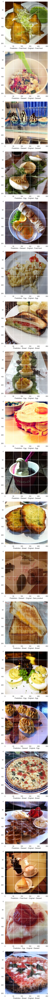

In [ ]:
# Printing 20 images, showing the original image classification and predicted image classification
fig = plt.figure(figsize=(100, 100))
for i in range(20):
    j = random.randint(0, len(image_list) - 1)
    fig.add_subplot(20, 1, i+1)
    plt.xlabel("Prediction - " + prediction[j] + "   Original - " + original[j])
    plt.imshow(image_list[j])
fig.tight_layout()
plt.show()

In [27]:
def predict_image(image_path, model):
    img = PIL.Image.open(image_path).resize((256, 256))
    img_array = np.asarray(img, dtype=np.float32) / 255.0
    img_array = img_array.reshape(-1, 256, 256, 3)
    prediction = model.predict(img_array)
    predicted_class = np.argmax(prediction)
    return predicted_class

In [29]:
model_path = r'D:\Food Recognition_Vs\best_model_res.keras'
loaded_model = tf.keras.models.load_model(model_path)

In [30]:
# Example usage:
new_image_path = r'D:\Food Recognition_Vs\validation\Bread\2.jpg'
predicted_class = predict_image(new_image_path, loaded_model)
print(f"Predicted Class Index: {predicted_class}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
Predicted Class Index: 0


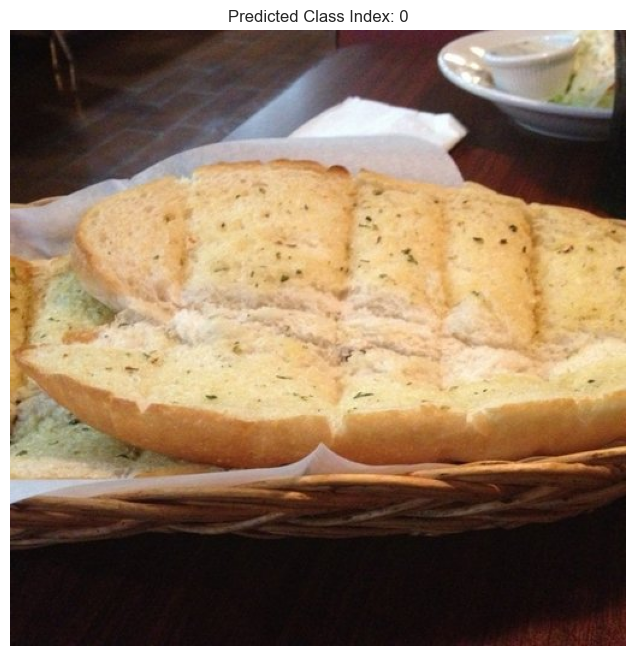

Predicted Label: Bread


In [31]:
# If you want to map the predicted class index to a label:
img = PIL.Image.open(new_image_path)
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted Class Index: {predicted_class}")
plt.show()
class_names = list(train_generator.class_indices.keys())
predicted_label = class_names[predicted_class]
print(f"Predicted Label: {predicted_label}")